In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sys
from scipy import signal
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import json
import csv
from scipy import signal
from scipy import interpolate

def interp(x, y, t):
    f = interpolate.interp1d(x, y)
    return f(t)
  
def rms(a):
  return np.sqrt(np.sum(a ** 2.0) / len(a))

In [2]:
import pandas as pd
from pandas import HDFStore

In [3]:
import seaborn as sns
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 1.5})
sns.set_style('whitegrid')

plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams['figure.facecolor'] = 'white'

In [4]:
id_to_desc = {'p1': 'P1: PTP',
 'p10_hdr': 'P10: GGGPFFL',
 'p11_hdr': 'P11: GGGPFL',
 'p12_hdr': 'P12: GGGPOFL',
 'p13_hdr': 'P13: GGGPOL',
 'p14_hdr': 'P14: GGGPc',
 'p15_hdr': 'P15: GGGPc2',
 'p16': 'P16: PN2',
 'p17': 'P17: PN2_2nd',
 'p2': 'P2: PFT',
 'p3': 'P3: POT',
 'p4': 'P4: PFTI',
 'p5': 'P5: POTI',
 'p6_hdr': 'P6: PFI',
 'p7_hdr': 'P7: POI',
 'p8_hdr': 'P8: Pc',
 'p9_hdr': 'P9: Pc2',

 't1': 'T1: TIG1',
 't10': 'T10: THe',
 't11': 'T11: TFTI',
 't12': 'T12: TOTI',
 't13': 'T13: TFIGW',
 't2': 'T2: TIG2',
 't3': 'T3: TFI',
 't4': 'T4: TOI',
 't5': 'T5: TOIW',
 't6': 'T6: GGGTOIW',
 't7': 'T7: GGGTc',
 't8': 'T8: GGGTc2',
 't9': 'T9: TAvio',
 't_a1': 'T-A1',
 't_a2': 'T-A2',
 't_c1': 'T-C1',
 't_d1': 'T-D1',
 't_e2': 'T-E2',
 't_p1': 'T-P1',
 't_p2': 'T-P2'}

In [5]:
def sensor_df(sensor):
    return pd.read_csv('./' + sensor + '.csv', index_col=False)

In [6]:
def plot_sensors(sensors):
    for s in sensors:
        df = sensor_df(s)
        label = s
        if s in id_to_desc:
            label = id_to_desc[s]
        plt.plot(df.iloc[:,0], df.iloc[:,1], label=label)

In [7]:
title = 'MOMO4 Flight (C-band Telemetry PC2)'

### Temperatures

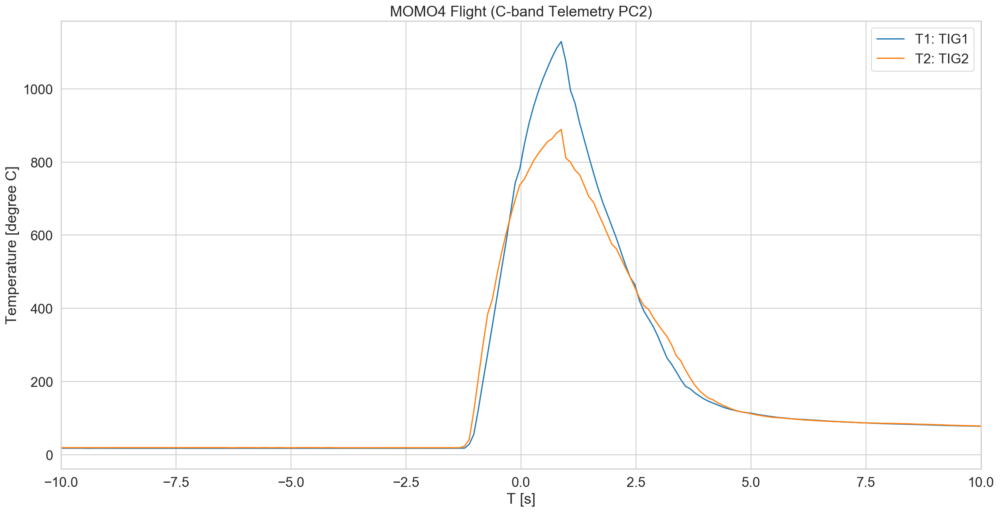

In [8]:
sensors = ['t1', 't2']
plot_sensors(sensors)
plt.legend()
plt.ylabel('Temperature [degree C]')
plt.xlabel('T [s]')
plt.xlim(-10, 10)
plt.title(title)
plt.savefig(title + '_temps_mcc_tig.png', dpi=300)

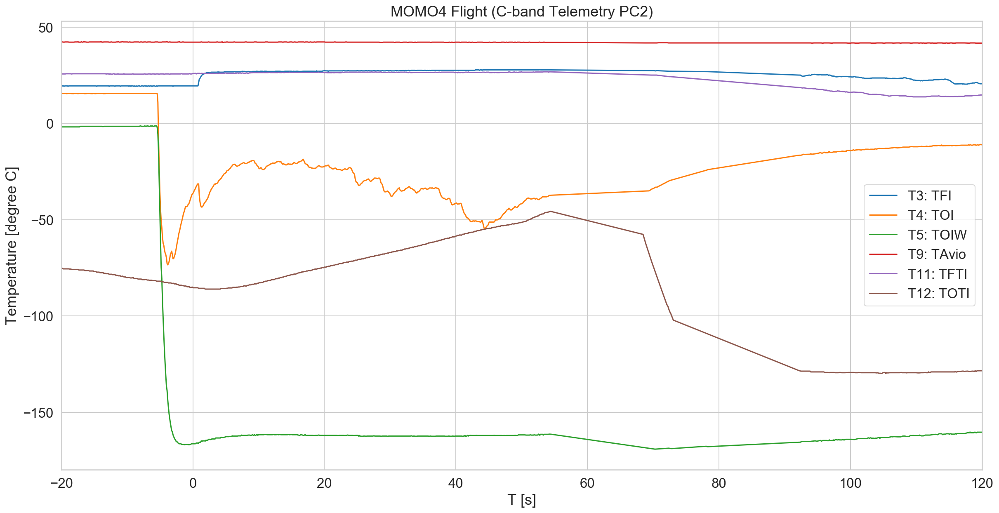

In [9]:
sensors = ['t3', 't4', 't5', 't9', 't11', 't12']
plot_sensors(sensors)
plt.legend()
plt.ylabel('Temperature [degree C]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,120)
plt.savefig(title + '_temps_mcc.png', dpi=300)

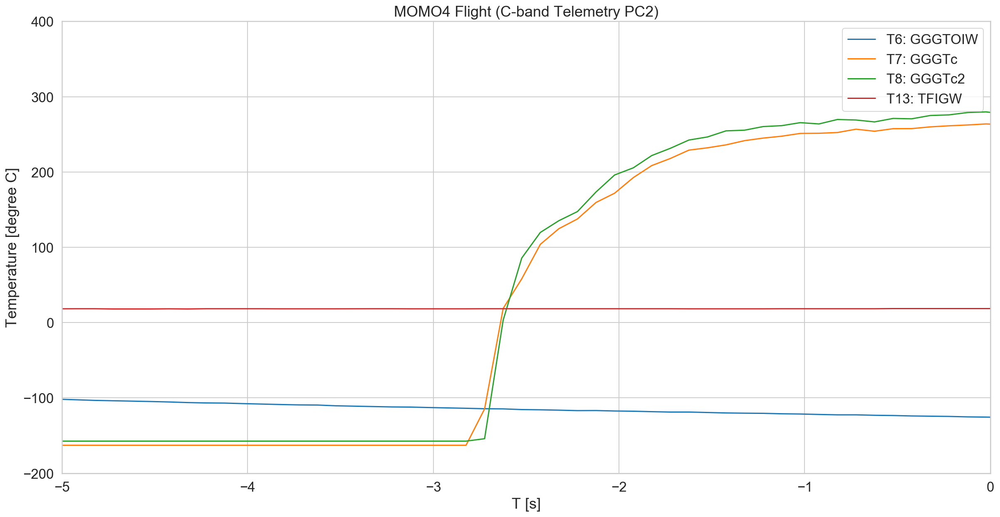

In [10]:
sensors = ['t6', 't7', 't8', 't13']
plot_sensors(sensors)
plt.legend()
plt.ylabel('Temperature [degree C]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-5,0)
plt.grid(True)
plt.ylim(-200,400)
plt.savefig(title + '_temps_ggg.png', dpi=300)

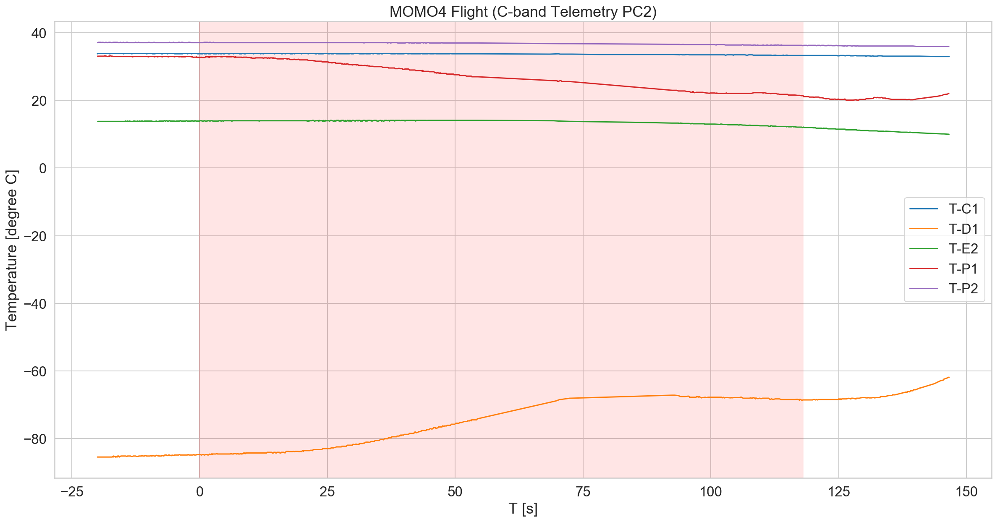

In [11]:
plot_sensors(['t_c1', 't_d1', 't_e2', 't_p1', 't_p2'])
plt.legend()
plt.ylabel('Temperature [degree C]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_temps_str.png', dpi=300)

### Pressures

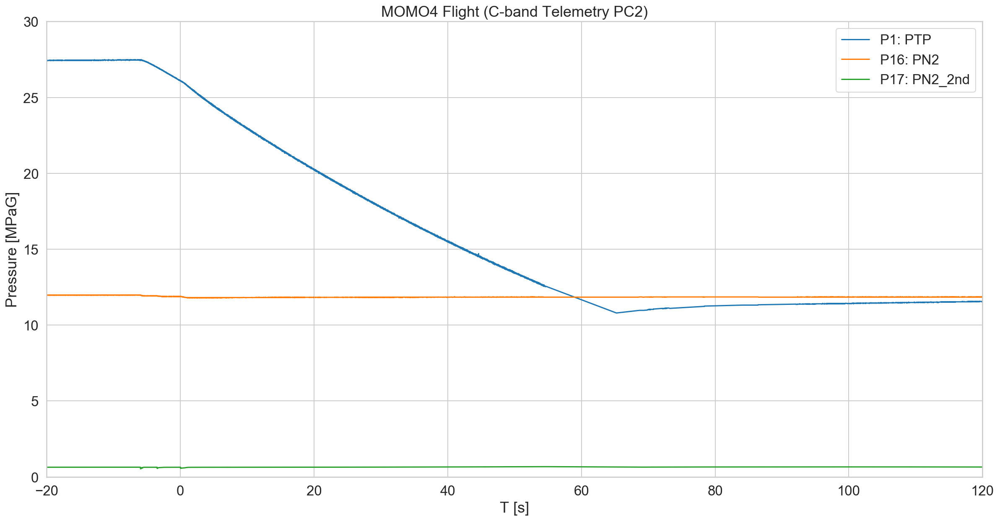

In [12]:
plot_sensors(['p1', 'p16', 'p17'])
plt.legend()
plt.ylabel('Pressure [MPaG]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,120)
plt.ylim(0,30)
plt.savefig(title + '_pressures_tank.png', dpi=300)

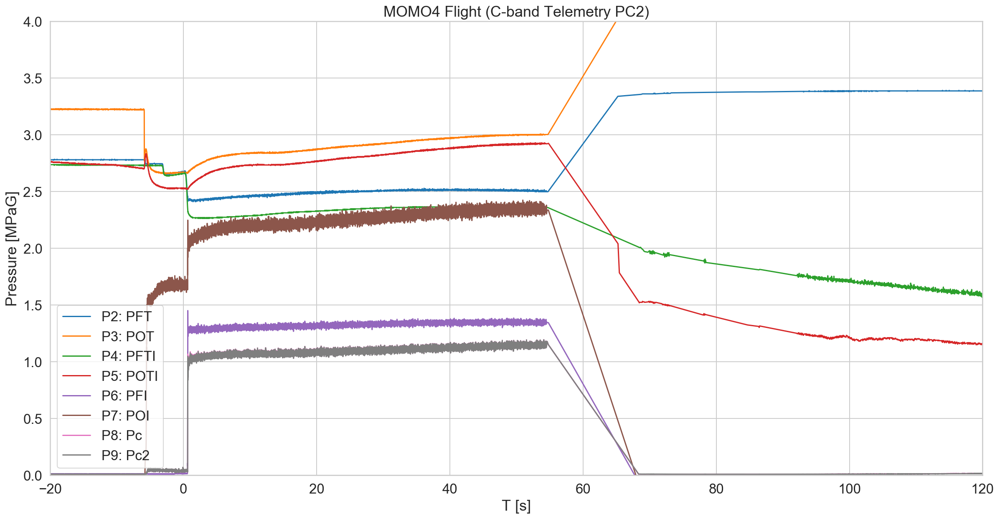

In [13]:
plot_sensors(['p2', 'p3', 'p4', 'p5', 'p6_hdr', 'p7_hdr', 'p8_hdr', 'p9_hdr'])
plt.legend()
plt.ylabel('Pressure [MPaG]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,120)
plt.ylim(0,4)
plt.savefig(title + '_pressures_mcc.png', dpi=300)

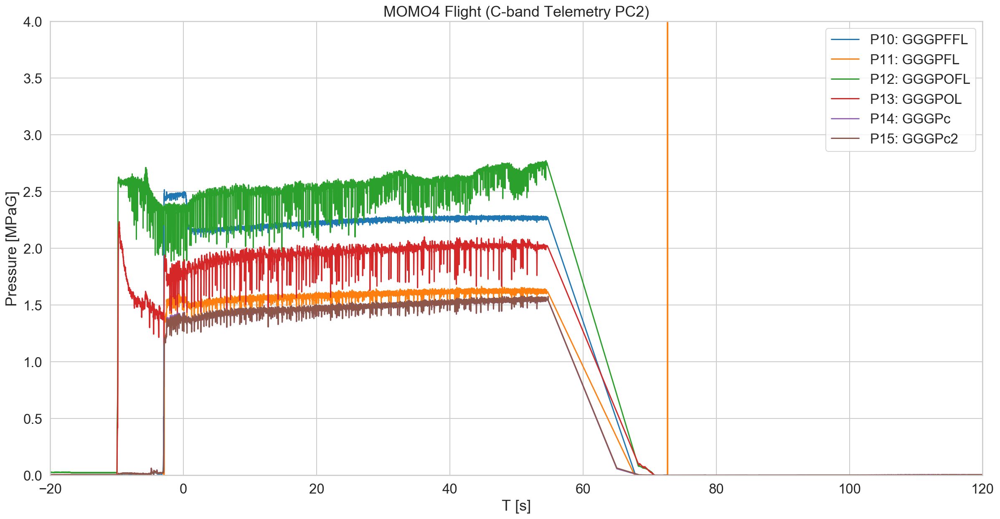

In [14]:
plot_sensors(['p' + str(n) + '_hdr' for n in range(10,16)])
plt.legend()
plt.ylabel('Pressure [MPaG]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,120)
plt.ylim(0,4)
plt.savefig(title + '_pressures_ggg.png', dpi=300)

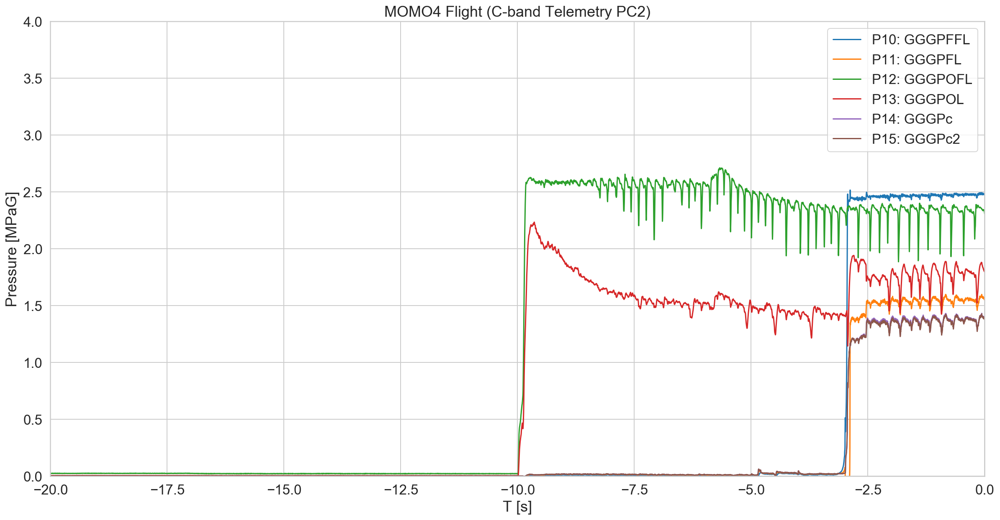

In [15]:
plot_sensors(['p' + str(n) + '_hdr' for n in range(10,16)])
plt.legend()
plt.ylabel('Pressure [MPaG]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,0)
plt.ylim(0,4)
plt.savefig(title + '_pressures_ggg.png', dpi=300)

### Gyroscope

In [16]:
df_gyro_1f_q = sensor_df('gyro_1f_quaternion')
df_gyro_5f_q = sensor_df('gyro_5f_quaternion')

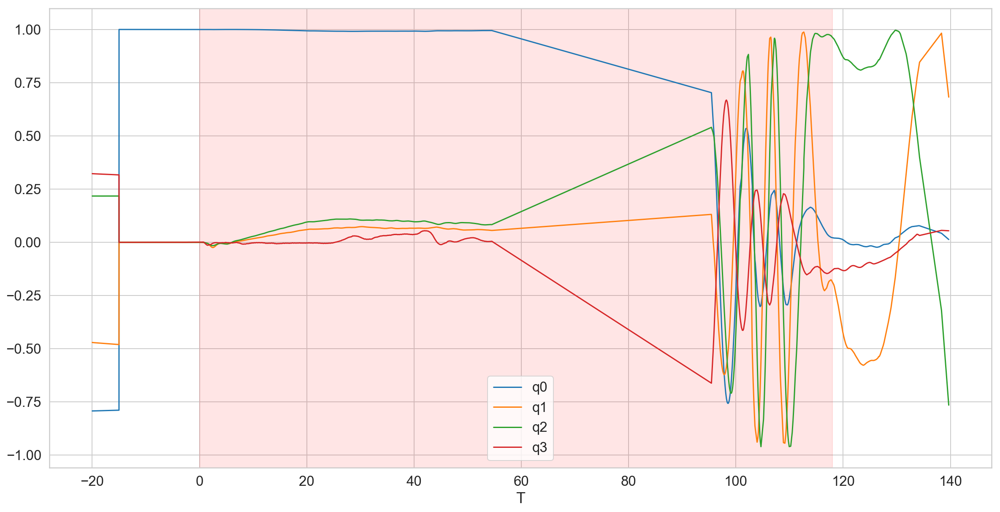

In [17]:
df_gyro_1f_q.plot(x='T')
plt.axvspan(0,118,color='red',alpha=0.1)

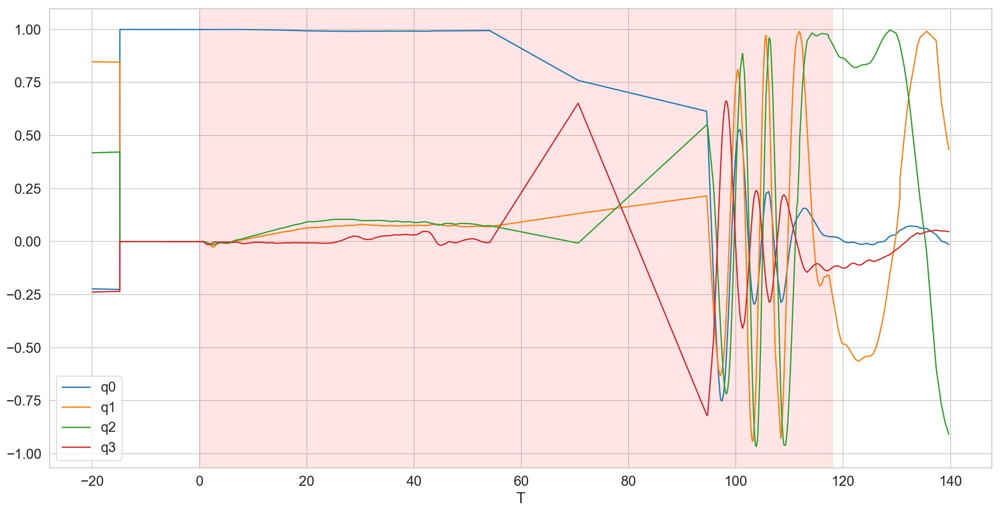

In [18]:
df_gyro_5f_q.plot(x='T')
plt.axvspan(0,118,color='red',alpha=0.1)

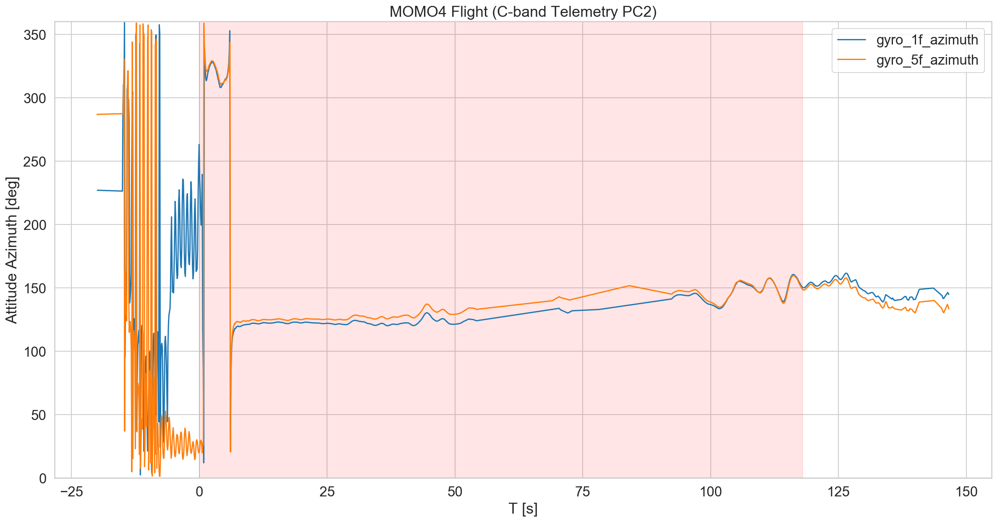

In [19]:
plot_sensors(['gyro_1f_azimuth', 'gyro_5f_azimuth'])
plt.legend()
plt.ylabel('Attitude Azimuth [deg]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(0, 360)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_azimuth.png', dpi=300)

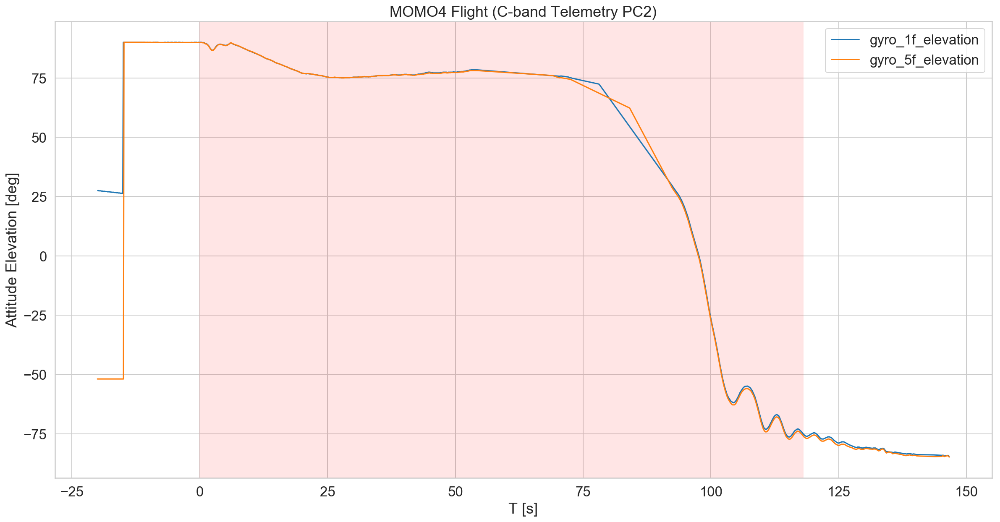

In [20]:
plot_sensors(['gyro_1f_elevation', 'gyro_5f_elevation'])
plt.legend()
plt.ylabel('Attitude Elevation [deg]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_elevation.png', dpi=300)

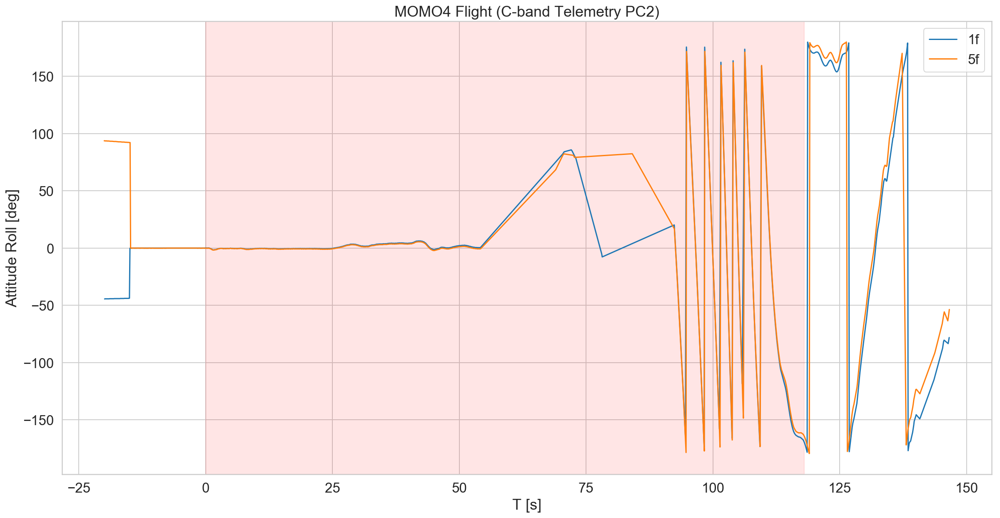

In [21]:
df_1f = sensor_df('gyro_1f_roll')
df_5f = sensor_df('gyro_5f_roll')
roll_1f = df_1f.iloc[:,1]
roll_5f = df_5f.iloc[:,1]
roll_1f = np.where(roll_1f  > 180, roll_1f-360.0, roll_1f)
roll_5f = np.where(roll_5f  > 180, roll_5f-360.0, roll_5f)
plt.plot(df_1f.iloc[:,0], roll_1f, label='1f')
plt.plot(df_5f.iloc[:,0], roll_5f, label='5f')
plt.legend()
plt.ylabel('Attitude Roll [deg]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_roll.png', dpi=300)

In [22]:
def plot_accelerator(sensors):
    df_ax = sensor_df(sensors[0])
    df_ay = sensor_df(sensors[1])
    df_az = sensor_df(sensors[2])
    
    # raw to g
    raw_to_g = 1.0 / (1.0 / 0.8e-3) # https://github.com/istellartech/AvionicsCode/blob/master/firmware/STM32F405/adis_board/momo/src/main.c#L226
    ax = (df_ax.iloc[:,1]) * raw_to_g
    ay = (df_ay.iloc[:,1]) * raw_to_g
    az = (df_az.iloc[:,1]) * raw_to_g
    norm =  np.sqrt(ax*ax + ay*ay + az*az)
    
    plt.plot(df_ax.iloc[:,0], ax, label=sensors[0], alpha=0.3)
    plt.plot(df_ay.iloc[:,0], ay, label=sensors[1], alpha=0.3)
    plt.plot(df_az.iloc[:,0], az, label=sensors[2], alpha=0.3)
    plt.plot(df_az.iloc[:,0], norm, label='norm', alpha=0.3)
    
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    window = 10
    ma_label = ' (ma10)'
    plt.plot(df_ax.iloc[:,0], ax.rolling(window, center=True).mean(), label=sensors[0] + ma_label, color=color_cycle[0])
    plt.plot(df_ay.iloc[:,0], ay.rolling(window, center=True).mean(), label=sensors[1] + ma_label, color=color_cycle[1])
    plt.plot(df_az.iloc[:,0], az.rolling(window, center=True).mean(), label=sensors[2] + ma_label, color=color_cycle[2])
    plt.plot(df_az.iloc[:,0], norm.rolling(window, center=True).mean(), label='norm' + ma_label, color=color_cycle[3])


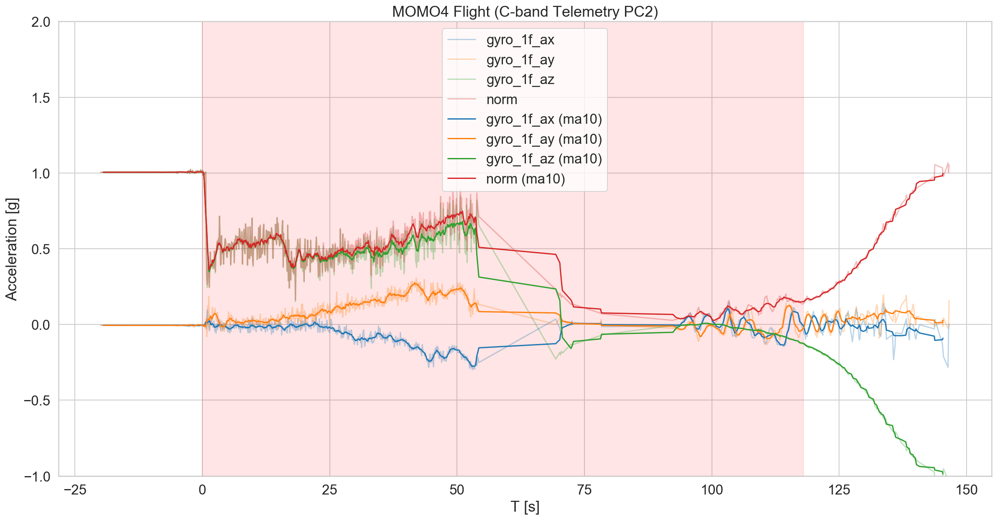

In [23]:
plot_accelerator(['gyro_1f_ax', 'gyro_1f_ay', 'gyro_1f_az'])
plt.legend()
plt.ylabel('Acceleration [g]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(-1,2)
plt.axvspan(0,118,color='red',alpha=0.1)
#plt.savefig(title + '_gyro_acc_1f.png', dpi=300)

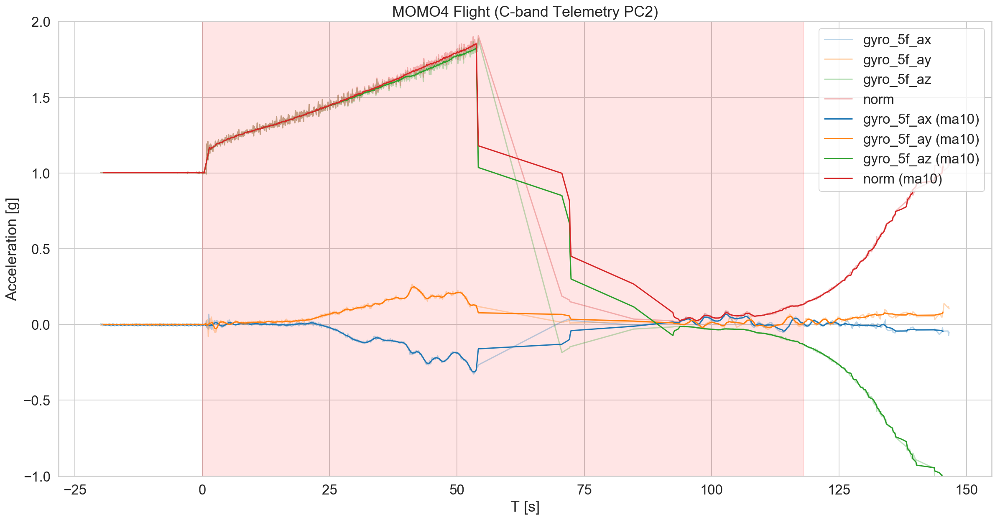

In [24]:
plot_accelerator(['gyro_5f_ax', 'gyro_5f_ay', 'gyro_5f_az'])
plt.legend()
plt.ylabel('Acceleration [g]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(-1,2)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_acc_5f.png', dpi=300)

In [25]:
def plot_angular_velo(sensors):
    df_wx = sensor_df(sensors[0])
    df_wy = sensor_df(sensors[1])
    df_wz = sensor_df(sensors[2])
    
    wx = df_wx.iloc[:,1]
    wy = df_wy.iloc[:,1]
    wz = df_wz.iloc[:,1]
    norm =  np.sqrt(wx*wy + wy*wy + wz*wz)
    
    plt.plot(df_wx.iloc[:,0], wx, label=sensors[0], alpha=0.3)
    plt.plot(df_wy.iloc[:,0], wy, label=sensors[1], alpha=0.3)
    plt.plot(df_wz.iloc[:,0], wz, label=sensors[2], alpha=0.3)
    plt.plot(df_wz.iloc[:,0], norm, label='norm', alpha=0.3)
    
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    window = 10
    ma_label = ' (ma10)'
    plt.plot(df_wx.iloc[:,0], wx.rolling(window, center=True).mean(), label=sensors[0] + ma_label, color=color_cycle[0])
    plt.plot(df_wy.iloc[:,0], wy.rolling(window, center=True).mean(), label=sensors[1] + ma_label, color=color_cycle[1])
    plt.plot(df_wz.iloc[:,0], wz.rolling(window, center=True).mean(), label=sensors[2] + ma_label, color=color_cycle[2])
    plt.plot(df_wz.iloc[:,0], norm.rolling(window, center=True).mean(), label='norm' + ma_label, color=color_cycle[3])


/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in sqrt
  if __name__ == '__main__':


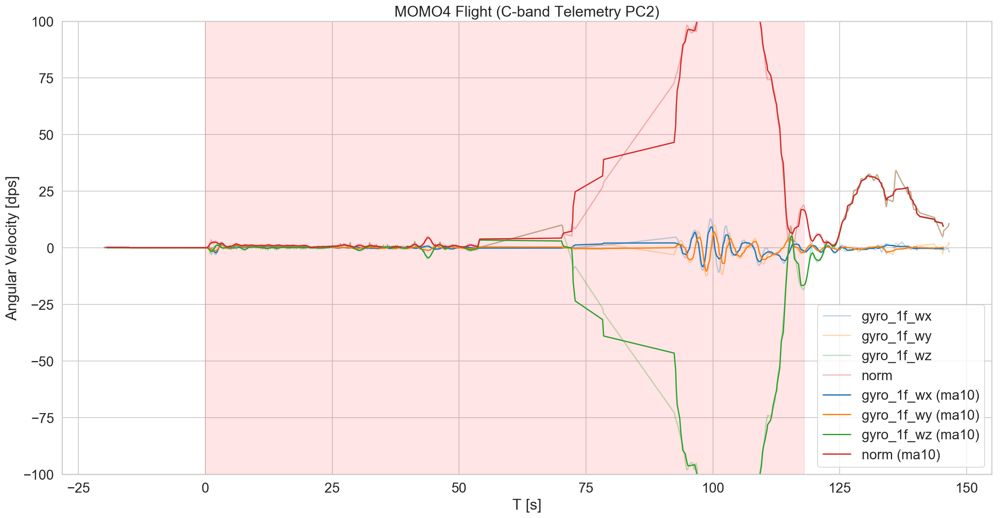

In [26]:
plot_angular_velo(['gyro_1f_wx', 'gyro_1f_wy', 'gyro_1f_wz'])
plt.legend()
plt.ylabel('Angular Velocity [dps]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(-100,100)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_angular_velo_1f.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in sqrt
  if __name__ == '__main__':


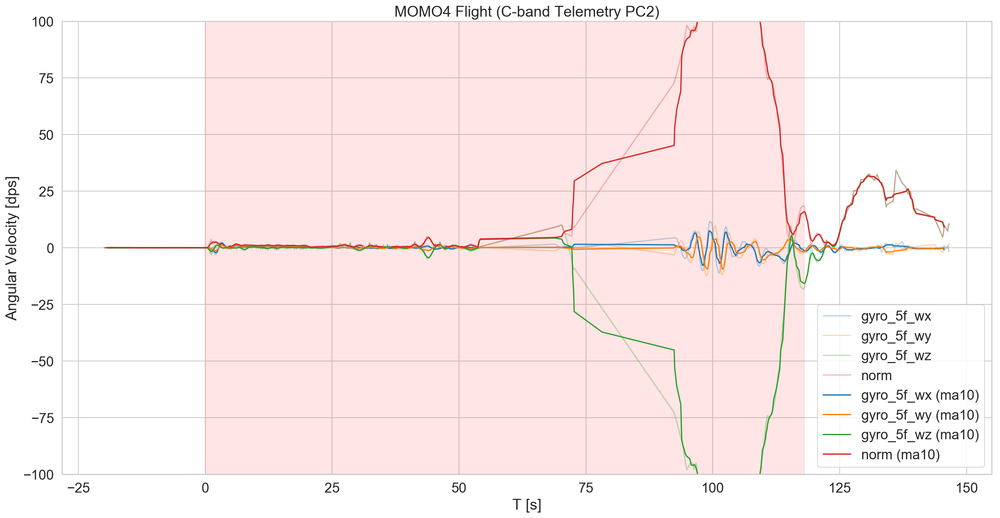

In [27]:
plot_angular_velo(['gyro_5f_wx', 'gyro_5f_wy', 'gyro_5f_wz'])
plt.legend()
plt.ylabel('Angular Velocity [dps]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(-100,100)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gyro_angular_velo_5f.png', dpi=300)

### GGG Servo

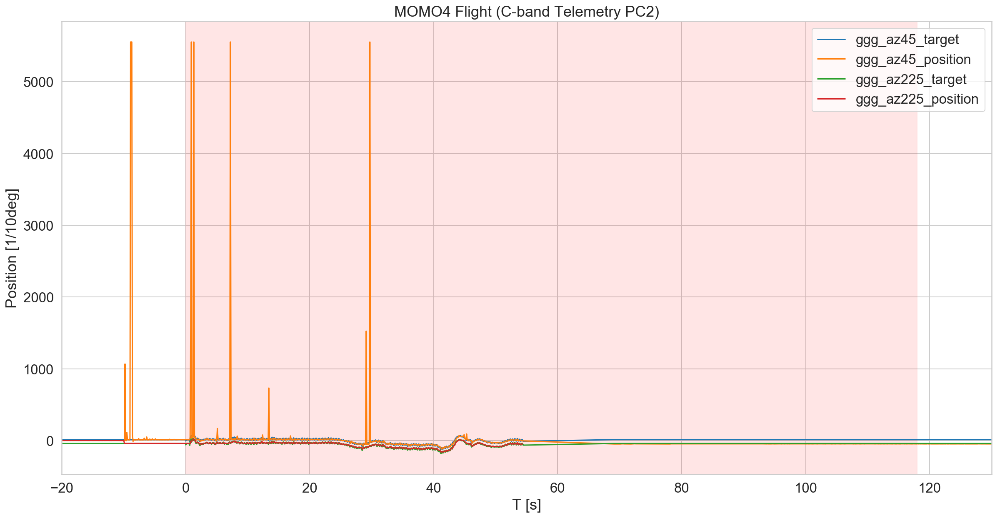

In [28]:
plot_sensors(['ggg_az45_target', 'ggg_az45_position', 'ggg_az225_target', 'ggg_az225_position'])
plt.legend()
plt.ylabel('Position [1/10deg]')
plt.xlabel('T [s]')
plt.title(title)
plt.xlim(-20,130)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_ggg_servo.png', dpi=300)

### GImbal

In [29]:
import math

# https://github.com/istellartech/AvionicsCode/blob/master/designs/momo_gimbal_fm_model/gimbal_model.ipynb
def gimbal_angle_motor_angle():
  width = 77.0
  height = 113.2
  a = math.sqrt(width*width + height*height)
  b = 18.0 #motor arm length
  c = 113.2 #arm length
  d = 95.0 #gimbal arm length
  sigma = math.atan2(width, height)
  sigma_deg = np.rad2deg(sigma)
  #ma = np.array([0.0]) #np.linspace(deg_to_rad(-45.0), deg_to_rad(45.0), 900)
  motor_max_deg = 48
  cnt = int((motor_max_deg*2)/360.0*4096*4)
  ma = np.linspace(np.deg2rad(-motor_max_deg), np.deg2rad(motor_max_deg), cnt)
  tb = np.pi/2.0 - sigma - ma 
  y = np.empty(len(tb))
  for i in range(len(tb)):
      theta_b = tb[i]
      g = np.sqrt(a*a + b*b + 2.0 * a * b * np.cos(theta_b))
      phi = math.acos((d*d+g*g-c*c)/(2.0*d*g)) + math.asin((b*np.sin(theta_b))/g)
      y[i] = phi

  ma_deg = np.rad2deg(ma)  
  motor_degs = np.rad2deg(ma)
  gimbal_degs = np.rad2deg(np.pi/2.0-sigma-y)
  
  ga = np.linspace(-8.0, 8.0, 8*100*2)
  tbl = np.empty(len(ga))
  for i in range(len(ga)):
      error = np.abs(gimbal_degs - ga[i])
      idx = np.argmin(error)
      tbl[i] = motor_degs[idx]
  
  tbl_encoder = (tbl / 360 * 4096 * 4).astype(np.int)
  return np.column_stack((ga, tbl_encoder))
  
def nearest_idx(a, num):
  if isinstance(num, np.ndarray):
    return [nearest_idx(a, x) for x in num]
  return np.abs(np.asarray(a) - num).argmin()
  
def gdeg2enc(gdeg_enc_tbl, gdeg):
  idx = nearest_idx(gdeg_enc_tbl[:,0], gdeg)
  ret = gdeg_enc_tbl[:,1][idx]
  if isinstance(ret, np.ndarray):
    return ret.astype(np.int)
  else:
    return int(ret)

def enc2gdeg(gdeg_enc_tbl, enc):
  idx = nearest_idx(gdeg_enc_tbl[:,1], enc)
  return gdeg_enc_tbl[:,0][idx]

gdeg_enc_tbl = gimbal_angle_motor_angle()


def enc2deg(enc):
    return enc2gdeg(gdeg_enc_tbl, enc)


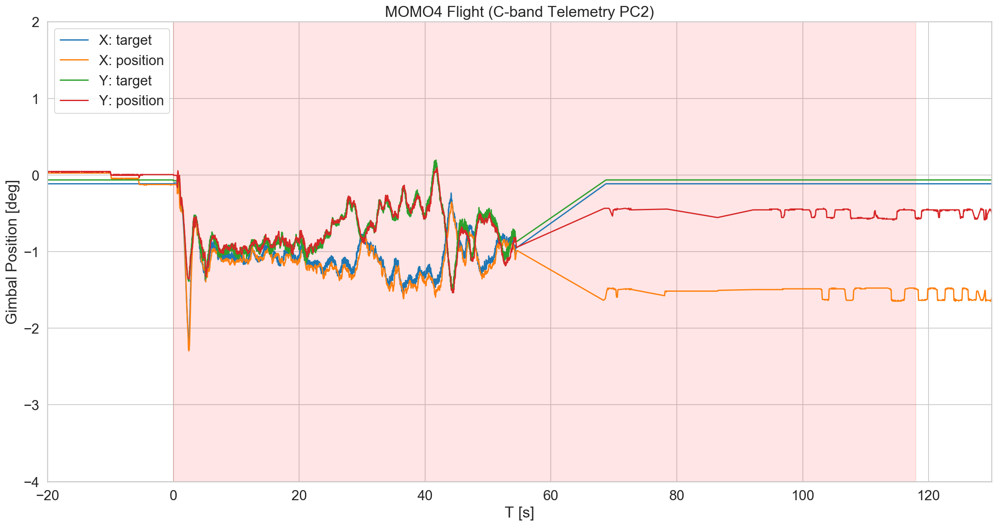

In [30]:
df_a_target = sensor_df('gimbal_a_target')
df_a_pos = sensor_df('gimbal_a_position')
df_b_target = sensor_df('gimbal_b_target')
df_b_pos = sensor_df('gimbal_b_position')

plt.plot(df_a_target.iloc[:,0], enc2deg(np.array(df_a_target.iloc[:,1])), label='X: target')
plt.plot(df_a_pos.iloc[:,0], enc2deg(np.array(df_a_pos.iloc[:,1])), label='X: position')
plt.plot(df_b_target.iloc[:,0], enc2deg(np.array(df_b_target.iloc[:,1])), label='Y: target')
plt.plot(df_b_pos.iloc[:,0], enc2deg(np.array(df_b_pos.iloc[:,1])), label='Y: position')
plt.legend()
plt.ylabel('Gimbal Position [deg]')
plt.xlabel('T [s]')
plt.xlim(-20,130)
plt.ylim(-4,2)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.title(title)
plt.savefig(title + '_gimbal_posiotion.png', dpi=300)

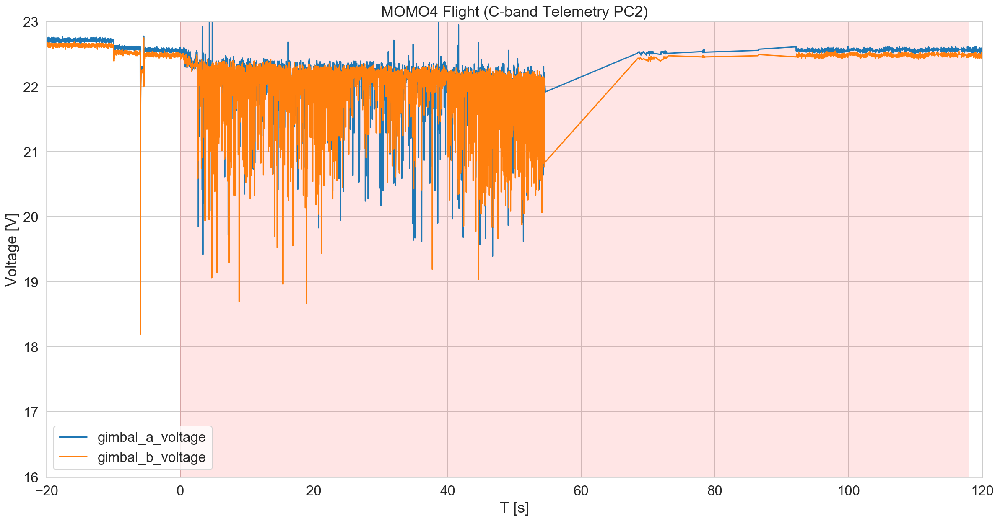

In [31]:
plot_sensors(['gimbal_a_voltage', 'gimbal_b_voltage'])
plt.legend()
plt.ylabel('Voltage [V]')
plt.xlabel('T [s]')
plt.xlim(-20,120)
plt.ylim(16,23)
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gimbal_voltage.png', dpi=300)

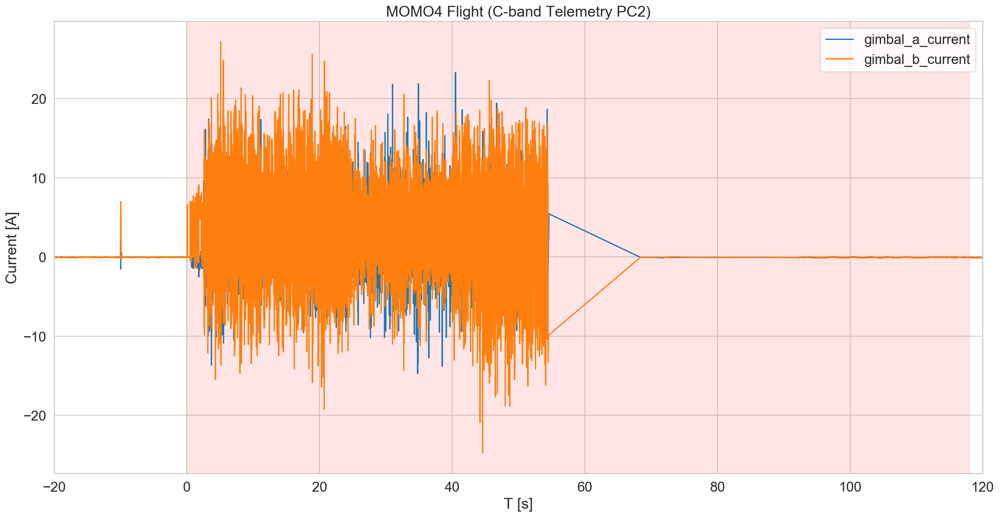

In [32]:
plot_sensors(['gimbal_a_current', 'gimbal_b_current'])
plt.legend()
plt.ylabel('Current [A]')
plt.xlabel('T [s]')
plt.xlim(-20,120)
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_gimbal_current.png', dpi=300)

### Barometer

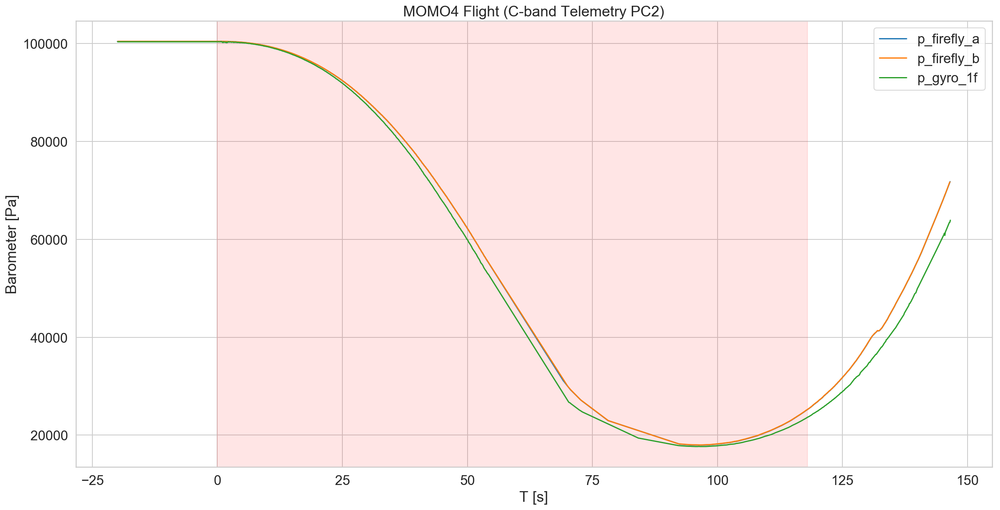

In [33]:
plot_sensors(['p_firefly_a', 'p_firefly_b', 'p_gyro_1f'])
plt.legend()
plt.ylabel('Barometer [Pa]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_barometer.png', dpi=300)

In [34]:
def plot_barometer_altitude(sensors):
    for s in sensors:
        df = sensor_df(s)
        label = s
        if s in id_to_desc:
            label = id_to_desc[s]
        h = 44330.0*(1.0-np.power((df.iloc[:,1]/df.iloc[:,1][0]),(1.0/5.255)))
        plt.plot(df.iloc[:,0], h, label=label)

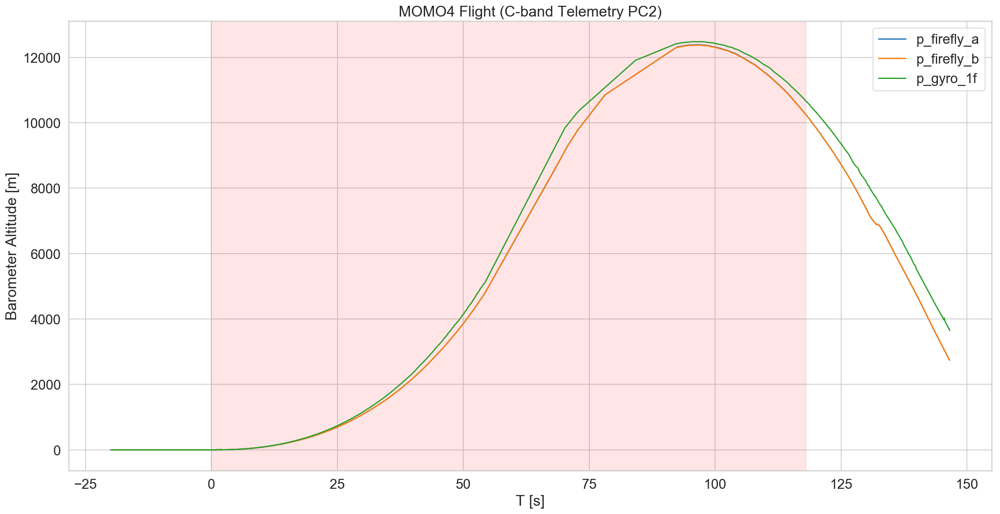

In [35]:
plot_barometer_altitude(['p_firefly_a', 'p_firefly_b', 'p_gyro_1f'])
plt.legend()
plt.ylabel('Barometer Altitude [m]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_barometer_altitude.png', dpi=300)

### Strain Gauges

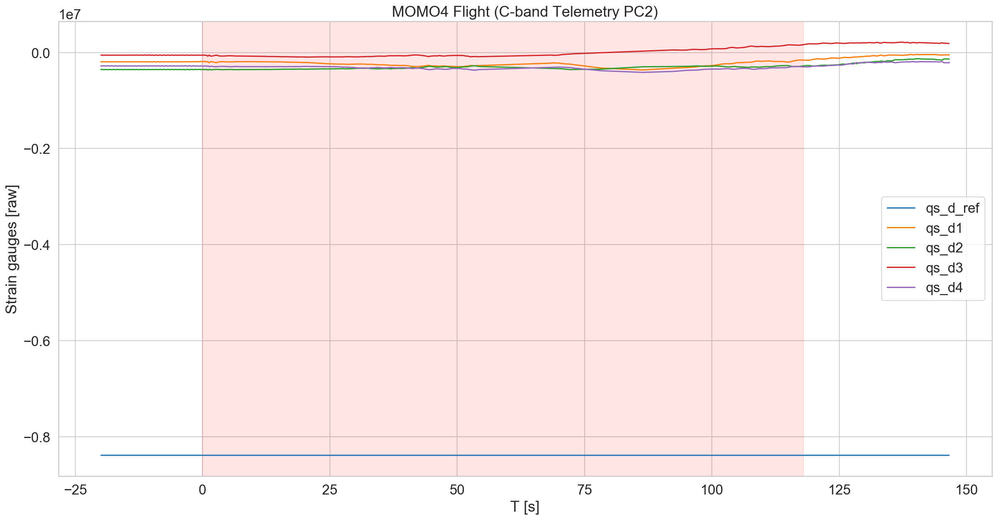

In [36]:
plot_sensors(['qs_d_ref', 'qs_d1', 'qs_d2', 'qs_d3', 'qs_d4'])
plt.legend()
plt.ylabel('Strain gauges [raw]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_qs_d.png', dpi=300)

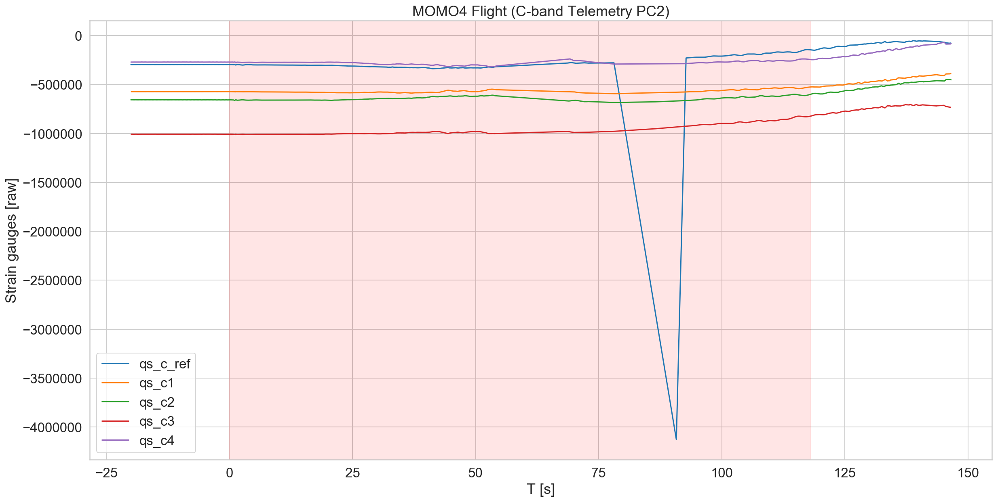

In [37]:
plot_sensors(['qs_c_ref', 'qs_c1', 'qs_c2', 'qs_c3', 'qs_c4'])
plt.legend()
plt.ylabel('Strain gauges [raw]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_qs_c.png', dpi=300)

### RF

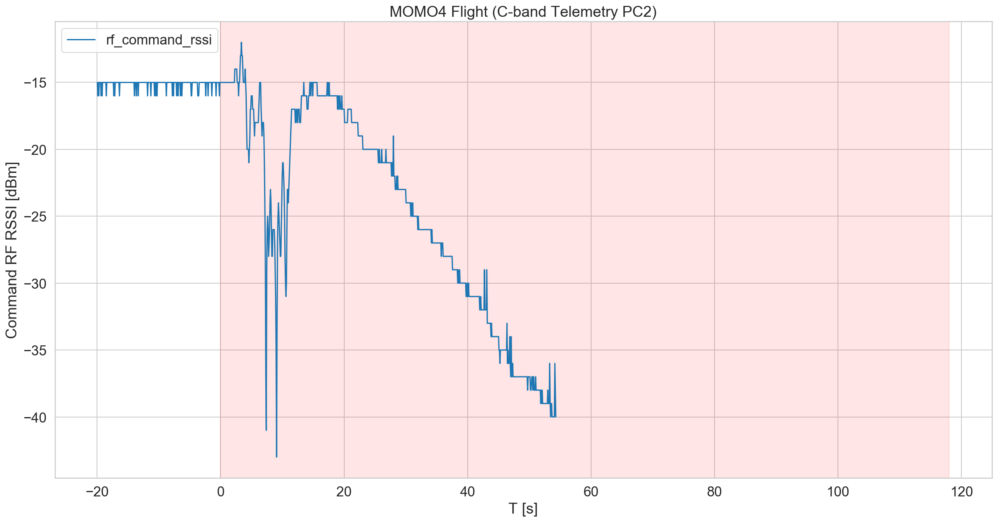

In [38]:
plot_sensors(['rf_command_rssi'])
plt.legend()
plt.ylabel('Command RF RSSI [dBm]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_command_rssi.png', dpi=300)

### Voltages

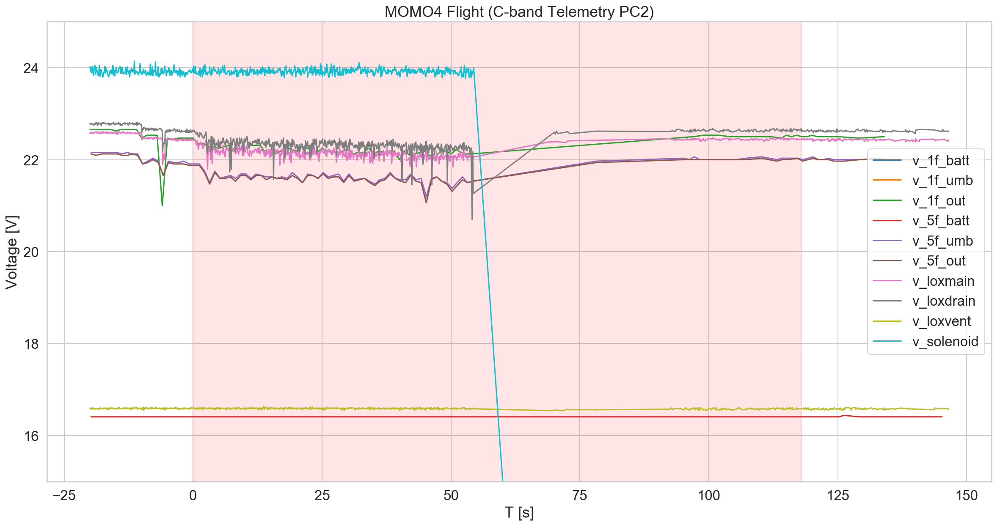

In [39]:
plot_sensors(['v_1f_batt', 'v_1f_umb', 'v_1f_out', 
              'v_5f_batt', 'v_5f_umb', 'v_5f_out', 
              'v_loxmain', 'v_loxdrain', 'v_loxvent', 'v_solenoid'])
plt.legend()
plt.ylabel('Voltage [V]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(15,25)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_voltages.png', dpi=300)

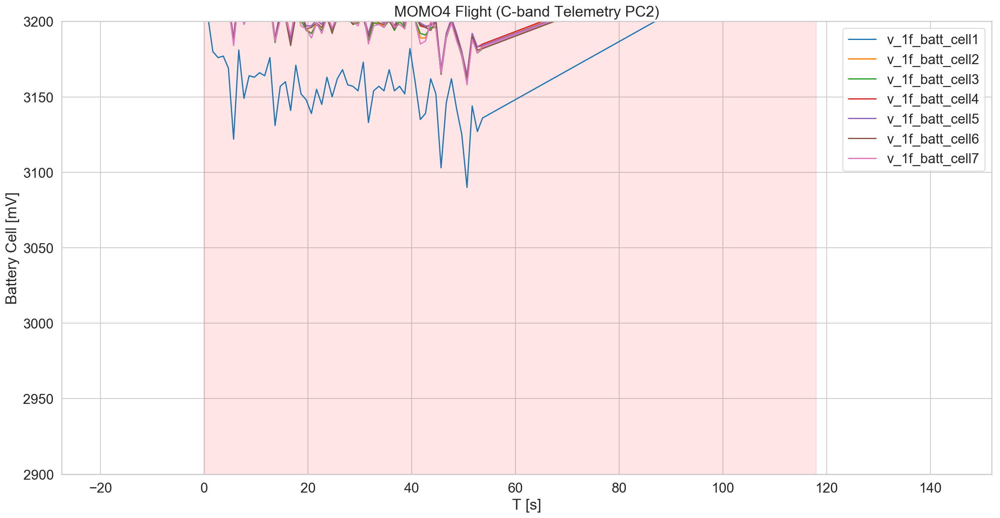

In [40]:
plot_sensors(['v_1f_batt_cell1', 'v_1f_batt_cell2', 'v_1f_batt_cell3', 'v_1f_batt_cell4', 
              'v_1f_batt_cell5', 'v_1f_batt_cell6', 'v_1f_batt_cell7'])
plt.legend()
plt.ylabel('Battery Cell [mV]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(2900, 3200)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_1f_batt.png', dpi=300)

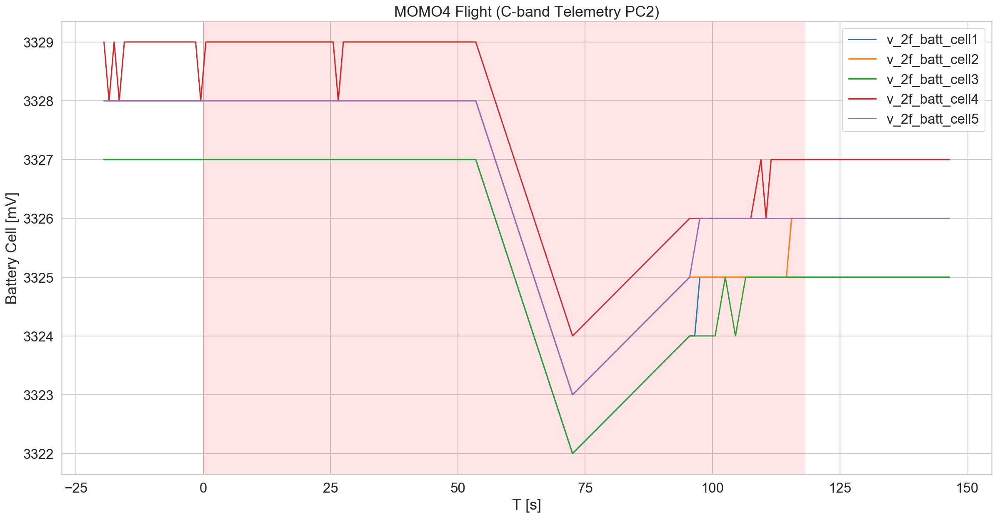

In [41]:
plot_sensors(['v_2f_batt_cell1', 'v_2f_batt_cell2', 'v_2f_batt_cell3', 'v_2f_batt_cell4', 'v_2f_batt_cell5'])
plt.legend()
plt.ylabel('Battery Cell [mV]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_2f_batt.png', dpi=300)

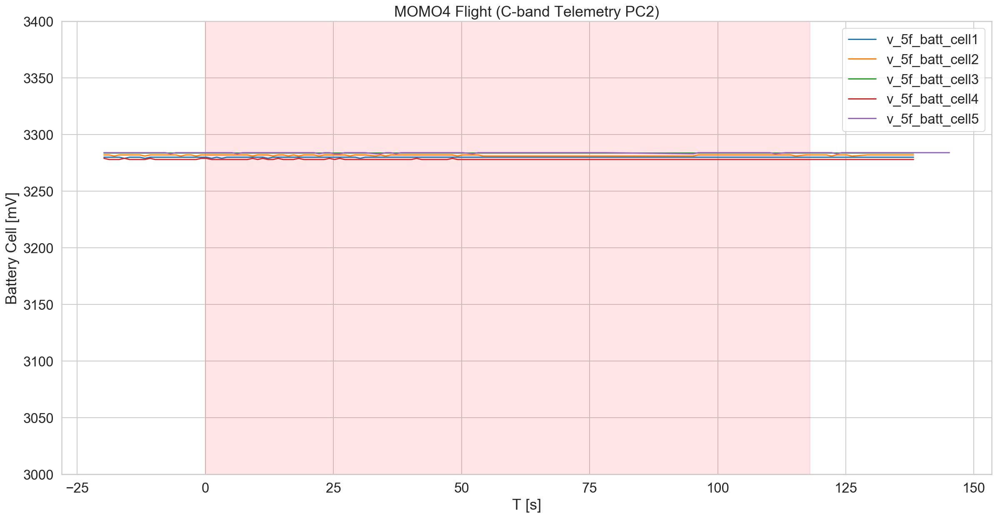

In [42]:
plot_sensors(['v_5f_batt_cell1', 'v_5f_batt_cell2', 'v_5f_batt_cell3', 'v_5f_batt_cell4', 'v_5f_batt_cell5'])
plt.legend()
plt.ylabel('Battery Cell [mV]')
plt.xlabel('T [s]')
plt.title(title)
plt.ylim(3000, 3400)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_5f_batt.png', dpi=300)

### Current

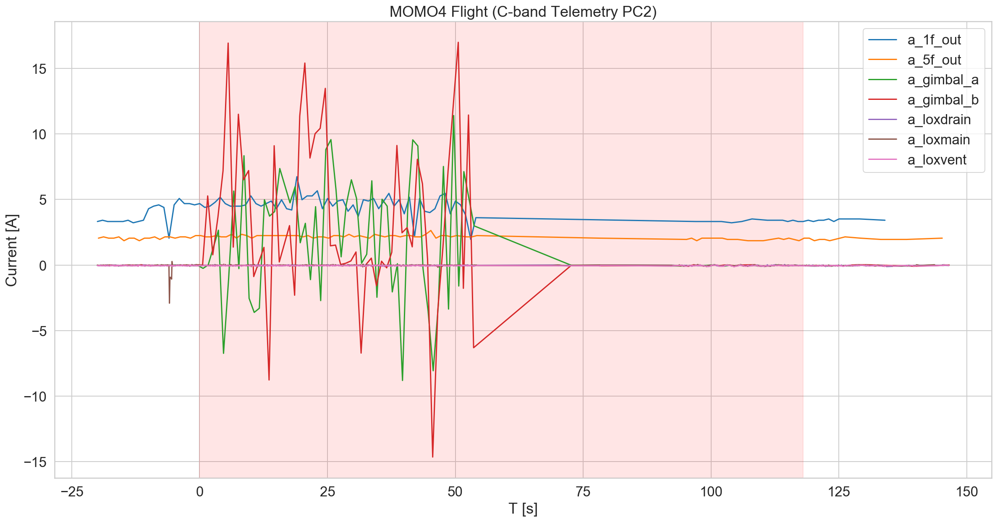

In [43]:
plot_sensors(['a_1f_out', 'a_5f_out', 'a_gimbal_a', 'a_gimbal_b', 'a_loxdrain', 'a_loxmain', 'a_loxvent'])
plt.legend()
plt.ylabel('Current [A]')
plt.xlabel('T [s]')
plt.title(title)
plt.axvspan(0,118,color='red',alpha=0.1)
plt.savefig(title + '_currents.png', dpi=300)

### GPS

In [44]:
df_gps_a = sensor_df('gps_a')
df_gps_b = sensor_df('gps_b')

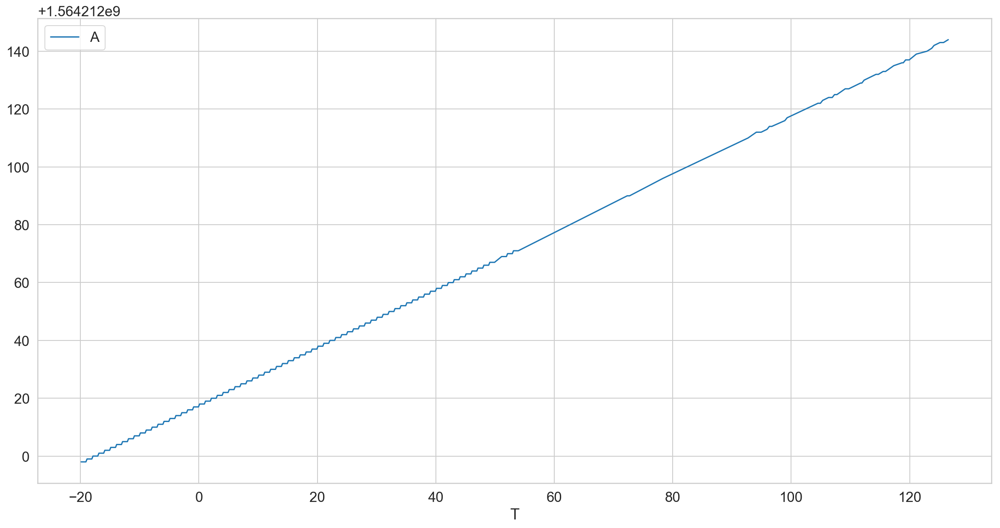

In [45]:
df_gps_a.plot(x='T', y='unixtime[s]', label='A')
#df_gps_b.plot(x='T', y='unixtime[s]', label='B', ax=ax)

In [46]:
import pymap3d as pm

In [47]:
(a_b,a_l,a_h) = pm.ecef2geodetic(df_gps_a['ecef_x[m]'], df_gps_a['ecef_y[m]'], df_gps_a['ecef_z[m]'])
(b_b,b_l,b_h) = pm.ecef2geodetic(df_gps_b['ecef_x[m]'], df_gps_b['ecef_y[m]'], df_gps_b['ecef_z[m]'])

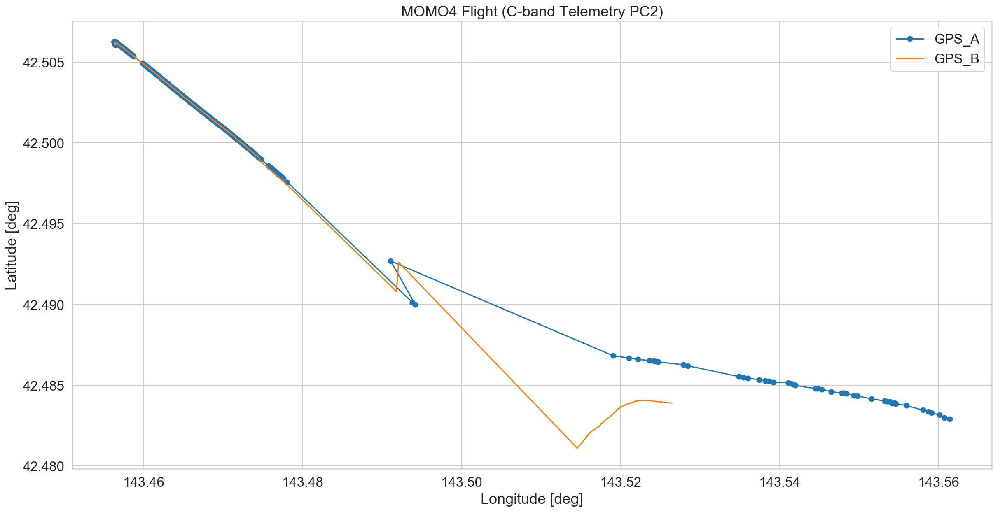

In [48]:
plt.plot(a_l, a_b,  'o-', label='GPS_A')
plt.plot(b_l, b_b, label='GPS_B')
plt.ylabel('Latitude [deg]')
plt.xlabel('Longitude [deg]')
plt.legend()
plt.title(title)
plt.savefig(title + '_gps_2d_position.png', dpi=300)

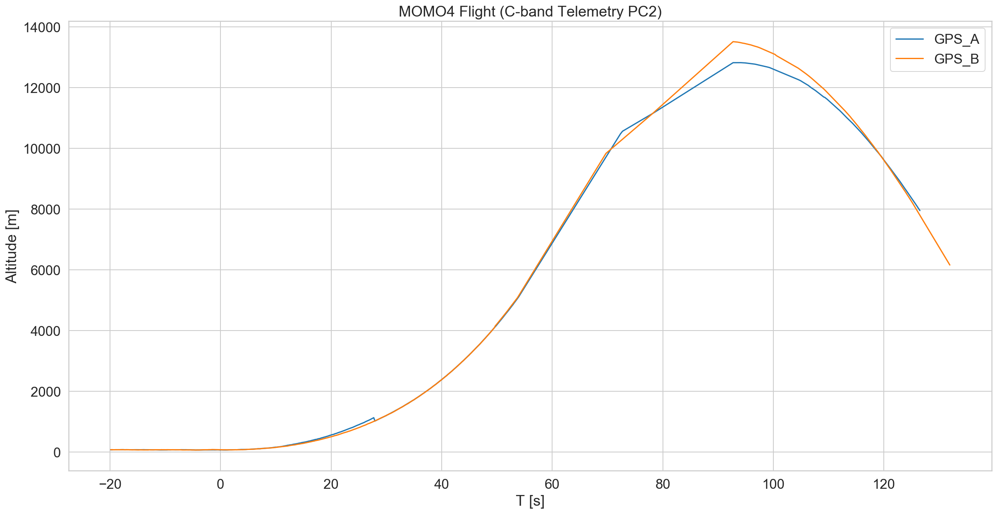

In [49]:
plt.plot(df_gps_a['T'], a_h, label='GPS_A')
plt.plot(df_gps_b['T'], b_h, label='GPS_B')
plt.legend()
plt.ylabel('Altitude [m]')
plt.xlabel('T [s]')
plt.title(title)
#plt.ylim(0, 120000)
plt.savefig(title + '_gps_altitude.png', dpi=300)

In [50]:
def get_enu(df):
    (b, l, h) = pm.ecef2geodetic(df['ecef_x[m]'][0], df['ecef_y[m]'][0], df['ecef_z[m]'][0])
    (e, n, u) = pm.ecef2enu(df['ecef_x[m]'], df['ecef_y[m]'], df['ecef_z[m]'], b, l, h)
    return (e, n, u)

In [51]:
enu_a = get_enu(df_gps_a)
enu_b = get_enu(df_gps_b)

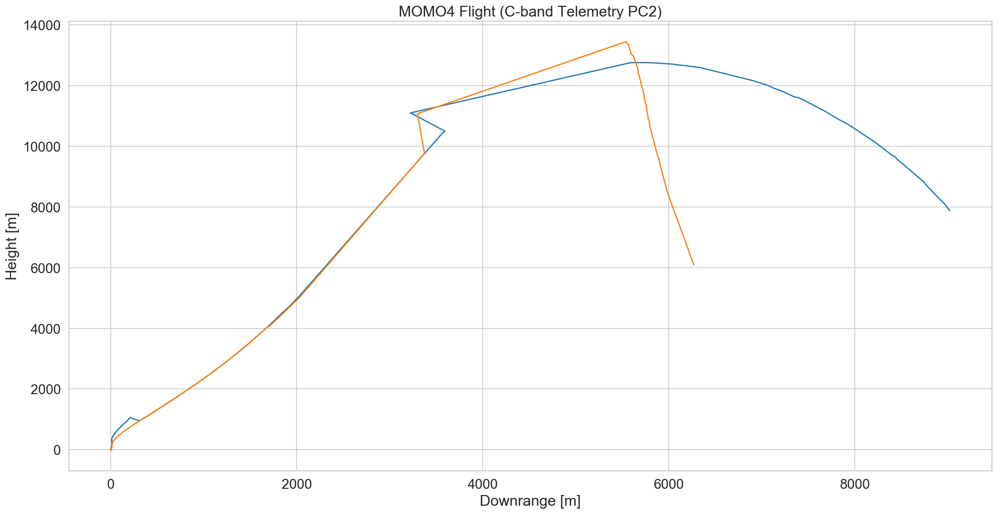

In [52]:
plt.plot(np.sqrt(enu_a[0]*enu_a[0] + enu_a[1]*enu_a[1]), enu_a[2], label='GPS_A')
plt.plot(np.sqrt(enu_b[0]*enu_b[0] + enu_b[1]*enu_b[1]), enu_b[2], label='GPS_B')
plt.ylabel('Height [m]')
plt.xlabel('Downrange [m]')
plt.title(title)
#plt.ylim(0, 120000)
#plt.xlim(0, 50000)
plt.savefig(title + '_gps_downrange.png', dpi=300)

### Vibration Sensor

In [53]:
import matplotlib.colors as colors


In [54]:
def plot_vibration(sensor):
    df = sensor_df(sensor)
    df['raw'] = ((df['raw']+1)/65536.0) * 10.0 # PSD [g^2/Hz]
    piv = pd.pivot_table(df, index='freq[Hz]', columns='T[s]', values='raw')
    #plt.pcolormesh(piv, cmap="jet", norm=colors.LogNorm(1e-4, 1e1))
    X,Y = np.meshgrid(np.array(piv.columns), np.array(piv.index))
    Z = np.array(piv)
    plt.pcolormesh(X, Y, Z, cmap="jet", norm=colors.LogNorm(1e-4, 1e1))
    cbar = plt.colorbar (orientation="vertical")
    cbar.set_label('PSD [g^2/Hz]')
    plt.xlabel('T [s]')
    plt.ylabel('Frequency [Hz]')
    plt.title(title + ': ' + sensor)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


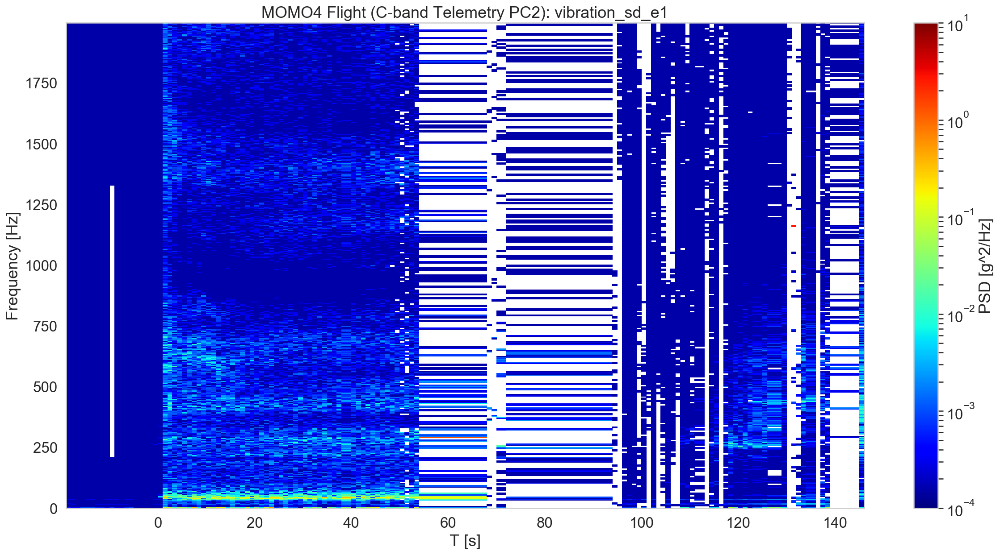

In [55]:
plot_vibration('vibration_sd_e1')
plt.savefig(title + '_vibration_sd_e1.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


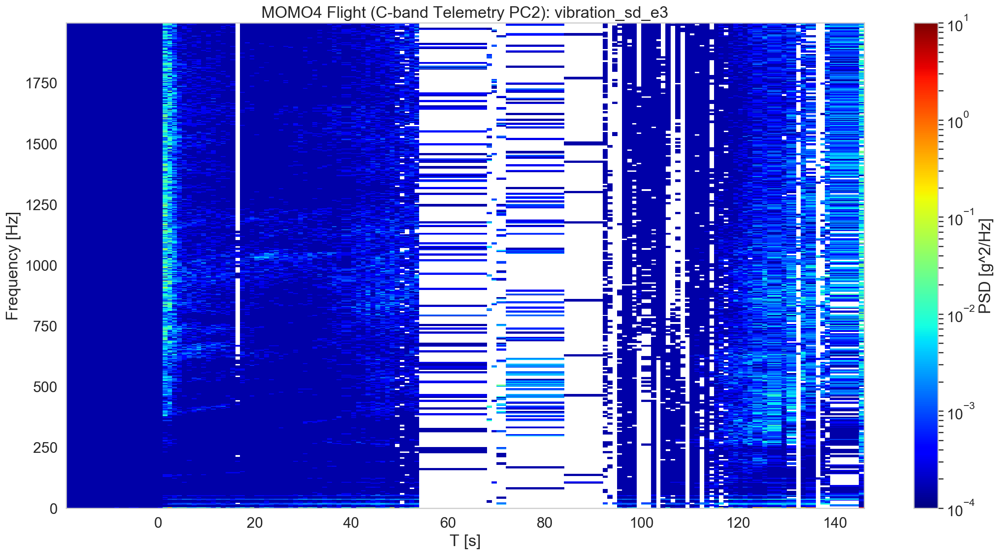

In [56]:
plot_vibration('vibration_sd_e3')
plt.savefig(title + '_vibration_sd_e3.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


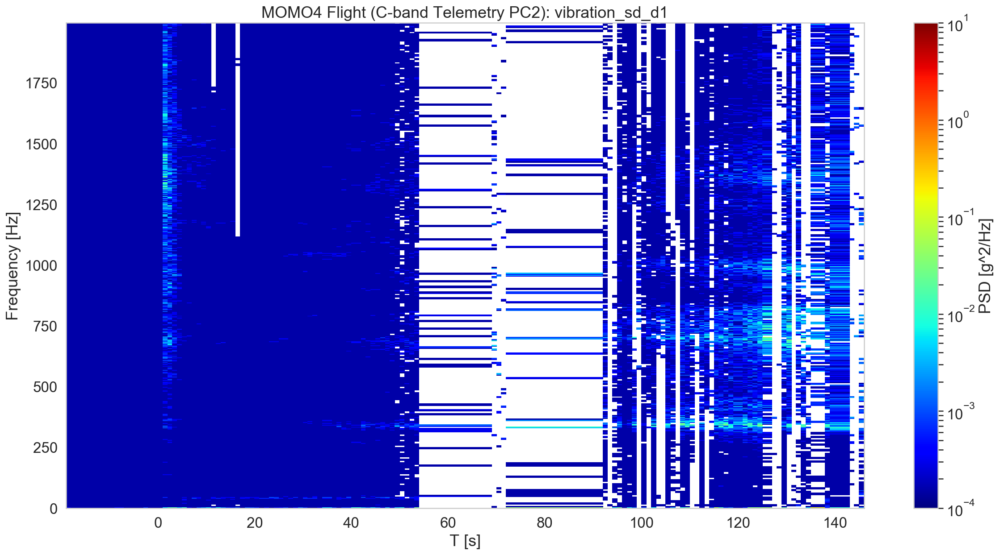

In [57]:
plot_vibration('vibration_sd_d1')
plt.savefig(title + '_vibration_sd_d1.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


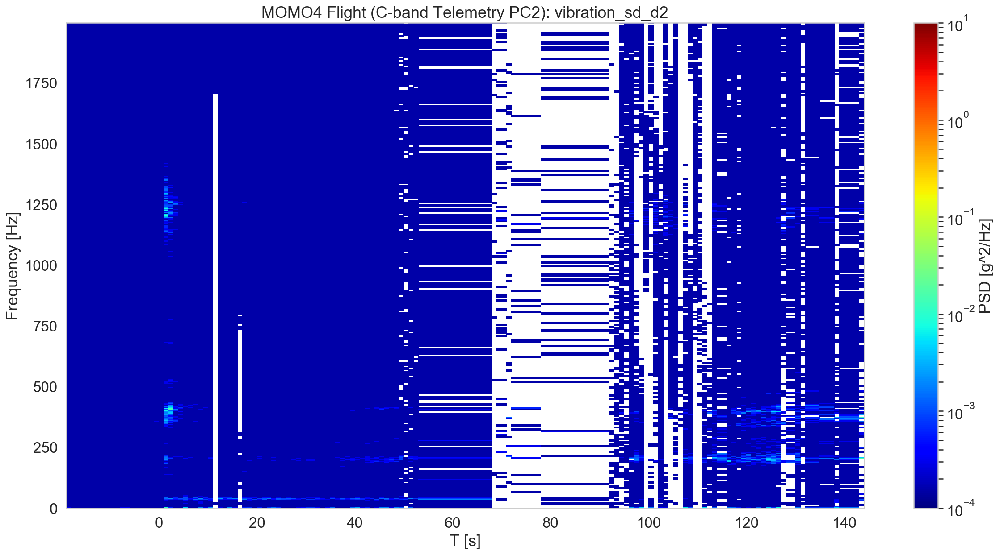

In [58]:
plot_vibration('vibration_sd_d2')
plt.savefig(title + '_vibration_sd_d2.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


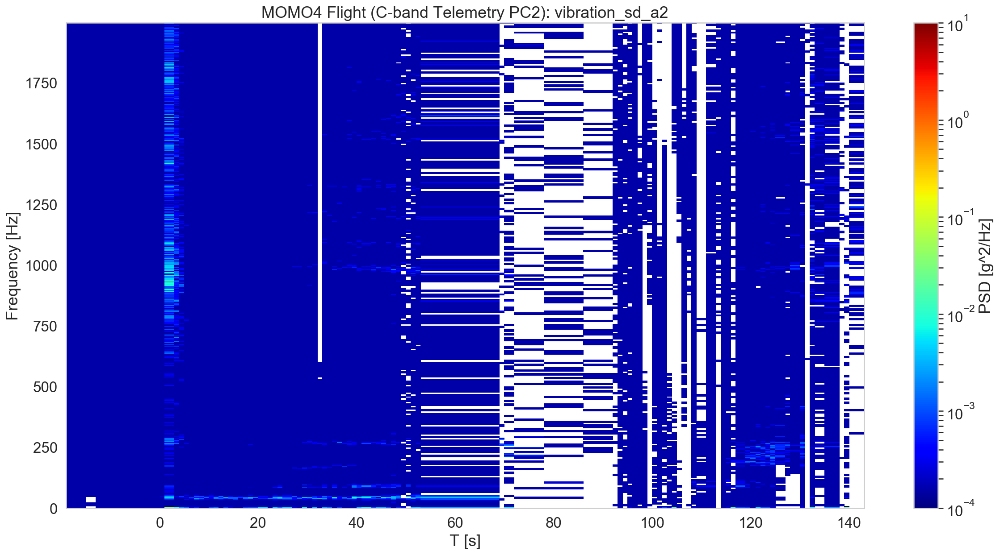

In [59]:
plot_vibration('vibration_sd_a2')
plt.savefig(title + '_vibration_sd_a2.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


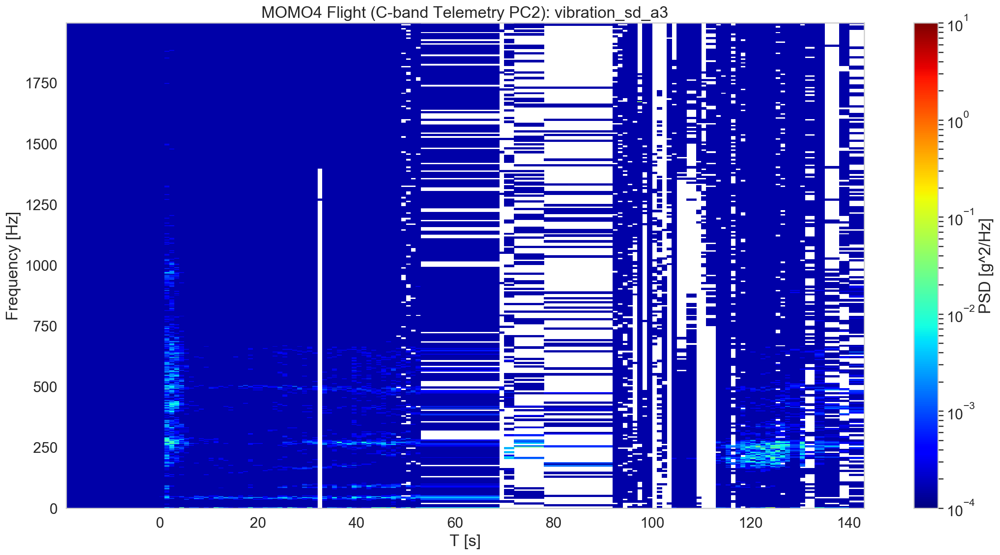

In [60]:
plot_vibration('vibration_sd_a3')
plt.savefig(title + '_vibration_sd_a3.png', dpi=300)

/Users/takuma/.pyenv/versions/anaconda3-5.3.1/lib/python3.7/site-packages/matplotlib/colors.py:1031: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


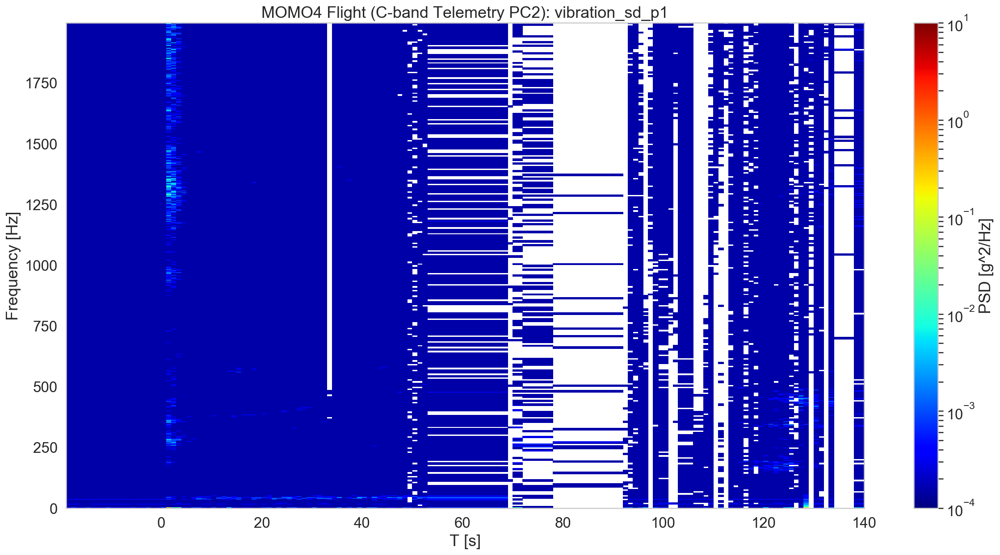

In [61]:
plot_vibration('vibration_sd_p1')
plt.savefig(title + '_vibration_sd_p1.png', dpi=300)

### CANbus

In [62]:
hdf = HDFStore('./can01_c_seq.h5')

In [63]:
def plot_can_tec_rec(hdf, can_id, label):
    df = hdf[can_id]
    plt.plot(df['T'], df['can_rec'], label=label + ': rec')
    plt.plot(df['T'], df['can_tec'], label=label + ': rec')

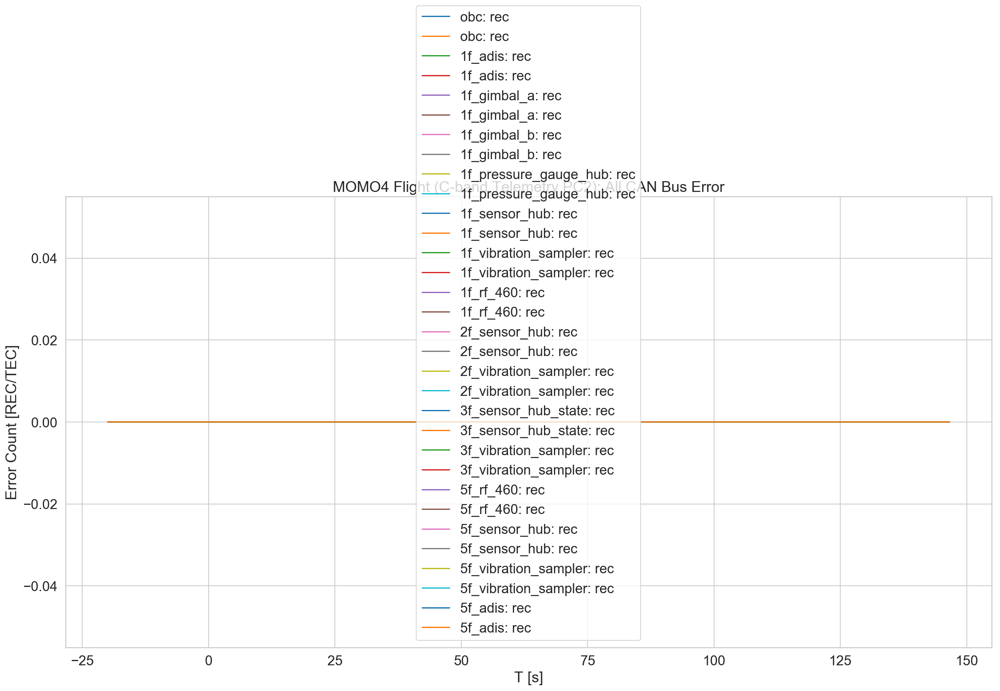

In [64]:
plot_can_tec_rec(hdf, 'CAN080', 'obc')
plot_can_tec_rec(hdf, 'CAN082', '1f_adis')
plot_can_tec_rec(hdf, 'CAN10A', '1f_gimbal_a')
plot_can_tec_rec(hdf, 'CAN10B', '1f_gimbal_b')
plot_can_tec_rec(hdf, 'CAN400', '1f_pressure_gauge_hub')
plot_can_tec_rec(hdf, 'CAN401', '1f_sensor_hub')
plot_can_tec_rec(hdf, 'CAN402', '1f_vibration_sampler')
plot_can_tec_rec(hdf, 'CAN143', '1f_rf_460')
plot_can_tec_rec(hdf, 'CAN403', '2f_sensor_hub')
plot_can_tec_rec(hdf, 'CAN404', '2f_vibration_sampler')
plot_can_tec_rec(hdf, 'CAN405', '3f_sensor_hub_state')
plot_can_tec_rec(hdf, 'CAN406', '3f_vibration_sampler')
plot_can_tec_rec(hdf, 'CAN141', '5f_rf_460')
plot_can_tec_rec(hdf, 'CAN407', '5f_sensor_hub')
plot_can_tec_rec(hdf, 'CAN408', '5f_vibration_sampler')
plot_can_tec_rec(hdf, 'CAN385', '5f_adis')
plt.legend()
plt.xlabel('T [s]')
plt.ylabel('Error Count [REC/TEC]')
plt.title(title + ': ' + 'All CAN Bus Error')
plt.savefig(title + '_can_error.png', dpi=300)